In [4]:
import os
import cv2
import numpy as np
from glob import glob
from scipy.io import loadmat
import matplotlib.pyplot as plt
import pandas as pd
import json
import sys 

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers

In [5]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

/home/marcin/anaconda3/envs/tensorflow/lib/python3.8/site-packages/tensorflow/python/client/session.py:1761: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [6]:
ABS_PATH = %pwd

In [7]:
slash_idx = [idx for idx,ch in enumerate(ABS_PATH) if ch=='/']

ABS_PATH = ABS_PATH[:slash_idx[-2]]

In [8]:
# add additional module import path
module_path = ABS_PATH + '/src/models'
if module_path not in sys.path:
    sys.path.append(module_path)

In [9]:
from modified_deeplabv3plus_v8_5 import Deeplabv3

In [10]:
BATCH_SIZE = 2

IMG_SIZE = 512

MASK_SIZE = 512

NUM_CLASSES = 5

NUM_TRAIN_IMAGES = 7470

NUM_VAL_IMAGES = 1602

NUM_TEST_IMAGES = 1602

VERSION = '8.5'

EPOCHS = 20

# Load data

In [11]:
DATA_DIR = ABS_PATH + '/data/processed'

In [12]:
TRAIN_PATH = DATA_DIR + '/train'
VAL_PATH = DATA_DIR + '/val'
TEST_PATH = DATA_DIR + '/test'

Parameters of image changed by dataset authors during augmentation:

1. hue  X
2. saturation  X
3. grayscale 
4. contrast  X
5. brightness  X
6. sharpness X
7. adding noise
8. doing flipping  X
9. rotation  X
10. cropping  X
11. padding

In [13]:
@tf.function
def augmentation(input_image, input_mask):
    
    # random crop and resize
    if tf.random.uniform(()) > 0.5:
        
        crop_size = np.random.randint(420, 490, dtype=int)
        
        input_image = tf.image.random_crop(input_image, size=(crop_size, crop_size, 3))
        input_image = tf.image.resize(input_image, [IMG_SIZE, IMG_SIZE])
        
        input_mask = tf.image.resize(input_mask, [IMG_SIZE, IMG_SIZE])
        input_mask = tf.image.random_crop(input_mask, size=(crop_size, crop_size, 1))
        input_mask = tf.image.resize(input_mask, [MASK_SIZE, MASK_SIZE])
        
    # random hue
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.random_hue(input_image, 0.2)
    
    # random saturation
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.random_saturation(input_image, 5, 10)
    
    # sharpness (image quality decrease)
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.random_jpeg_quality(input_image, 75, 95)
        input_image = tf.reshape(input_image, (IMG_SIZE, IMG_SIZE,3))
        
    # random brightness adjustment illumination
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.random_brightness(input_image, 0.3)
    
    # random contrast adjustment
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.random_contrast(input_image, 0.2, 0.5)
    
    # random horizontal flip
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)
    
    # random vertical flip
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_up_down(input_image)
        input_mask = tf.image.flip_up_down(input_mask)

#     # rotation in 30° steps
#     if tf.random.uniform(()) > 0.5:
#         rot_factor = tf.cast(tf.random.uniform(shape=[], maxval=12, dtype=tf.int32), tf.float32)
#         angle = np.pi/12*rot_factor
#         input_image = tfa.image.rotate(input_image, angle)
#         input_mask = tfa.image.rotate(input_mask, angle)
    
    return input_image, input_mask

In [14]:
def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.image.decode_png(image, channels=3)
        image = image[..., 0]
        image = tf.reshape(image, (MASK_SIZE, MASK_SIZE, 1))
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[MASK_SIZE, MASK_SIZE])
    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMG_SIZE, IMG_SIZE])
        image = image / 255.
    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def load_augmented_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    image, mask = augmentation(image, mask)
    return image, mask


def data_generator(image_list, mask_list, augmentation=False, factor=1):
    
    """
    Returns augmented or not augmented dataset with the same amount of elements.
    
    Args:
    image_list: list of paths to each image
    mask_list: list of paths to corresponding masks of images (sorted)
    augmentation: "True" for getting augmeneted images and masks
    """
    
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    
    if augmentation:
        dataset = dataset.map(load_augmented_data, num_parallel_calls=tf.data.AUTOTUNE)
    
    else:
        dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
        
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    
    if factor > 1 and augmentation:
        for _ in range(factor-1):
            dataset_to_concat = dataset.map(load_augmented_data, num_parallel_calls=tf.data.AUTOTUNE)
            dataset = dataset.concatenate(dataset_to_concat)

    return dataset

In [15]:
train_images = sorted(glob(os.path.join(TRAIN_PATH, "images/img/*")))
train_masks = sorted(glob(os.path.join(TRAIN_PATH, "masks/img/*")))
val_images = sorted(glob(os.path.join(VAL_PATH, "images/img/*")))
val_masks = sorted(glob(os.path.join(VAL_PATH, "masks/img/*")))
test_images = sorted(glob(os.path.join(TEST_PATH, "images/img/*")))
test_masks = sorted(glob(os.path.join(TEST_PATH, "masks/img/*")))

In [16]:
# opens txt file generated in 6.1 notebook
# txt file contains file paths of low quality masks and
# corresponding images to exclude
# then it removes it from lists of files to be loaded to dataset


def remove_file_paths_according_to_previously_generated_txt(list_with_file_names, nested_list_with_data_paths):

    for name, data_list in zip(list_with_file_names, nested_list_with_data_paths):

        open_path = ABS_PATH + f'/src/data/evaluation_of_masks/{name}_to_exclude.txt'

        with open(open_path) as file:

            for line in file:
                element = line.rstrip()

                if element in data_list:
                    data_list.remove(element)

                else:
                    pass

In [17]:
file_names = ['train_images', 'train_masks', 'val_images',
            'val_masks']

data_lists = [train_images, train_masks, val_images, 
              val_masks]


remove_file_paths_according_to_previously_generated_txt(file_names, data_lists)

In [18]:
train_dataset = data_generator(train_images, train_masks)
val_dataset = data_generator(val_images, val_masks)
test_dataset = data_generator(test_images, test_masks)

print("Train Dataset:", train_dataset)
print("Number of images in Train Dataset:", BATCH_SIZE * len(train_dataset))
print("Val Dataset:", val_dataset)
print("Number of images in Val Dataset:", BATCH_SIZE * len(val_dataset))
print("Test Dataset:", test_dataset)
print("Number of images in Val Dataset:", BATCH_SIZE * len(test_dataset))

Train Dataset: <BatchDataset shapes: ((2, 512, 512, 3), (2, 512, 512, 1)), types: (tf.float32, tf.float32)>
Number of images in Train Dataset: 7354
Val Dataset: <BatchDataset shapes: ((2, 512, 512, 3), (2, 512, 512, 1)), types: (tf.float32, tf.float32)>
Number of images in Val Dataset: 1566
Test Dataset: <BatchDataset shapes: ((2, 512, 512, 3), (2, 512, 512, 1)), types: (tf.float32, tf.float32)>
Number of images in Val Dataset: 1602


In [19]:
NUM_TRAIN_IMAGES = BATCH_SIZE * len(train_dataset)
NUM_VAL_IMAGES = BATCH_SIZE * len(val_dataset)

# Class balance 

In [20]:
# class_count = {
#     0: 0.0,
#     1: 0.0,
#     2: 0.0,
#     3: 0.0,
#     4: 0.0
# }

# for mask_path in train_masks:

#     mask = read_image(mask_path, mask=True)
    
#     class_arr = mask[..., 0]

#     one_mask_count = np.unique(class_arr, return_counts=True)

#     for i in range(len(one_mask_count[0])):
#         class_count[one_mask_count[0][i]] += one_mask_count[1][i]

# class_count

,class_number,pixel_count
background,0,1.134440e+09
buildings,1,1.676724e+07
woodland,2,6.487148e+08
water,3,1.265083e+08
roads,4,3.178538e+07


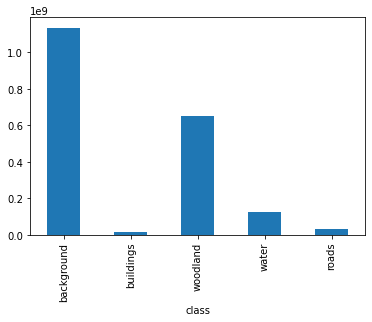

In [21]:
# create dict with already calculated values to bypass renewed calculating

class_count = {
     0: 1134439928.0, 
     1: 16767238.0, 
     2: 648714832.0, 
     3: 126508305.0, 
     4: 31785377.0
}

CLASS_NAMES = ['background', 'buildings', 'woodland', 'water', 'roads']

df = pd.DataFrame(data=class_count.items(), 
                  index=CLASS_NAMES, 
                  columns=['class_number', 'pixel_count'])

df.loc[:, 'pixel_count'].plot.bar()
plt.xlabel('class')

df

In [22]:
def get_class_weight(dictionary):
    
    weights_dict = {}
    
    n_samples = sum(dictionary.values())
    
    for key in dictionary:
        weights_dict[key] = round(n_samples / (NUM_CLASSES * dictionary[key]), 4)
        
    return weights_dict

In [23]:
# def get_class_weight(dictionary):
    
#     id_max_val = max(dictionary, key=dictionary.get)
#     max_val = dictionary[id_max_val]
    
#     for key in dictionary:
#         dictionary[key] = int(max_val / dictionary[key])
        
#     return dictionary

In [24]:
class_weight = get_class_weight(class_count)
class_weight

{0: 0.3452, 1: 23.3576, 2: 0.6037, 3: 3.0958, 4: 12.3215}

# DeepLabv3+

https://keras.io/examples/vision/deeplabv3_plus/

## Create model architecture

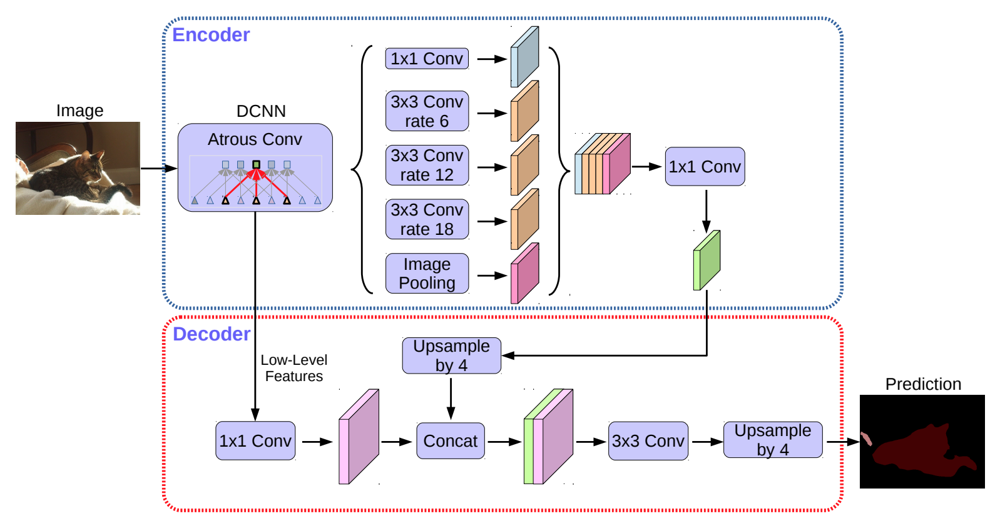

In [25]:
def get_deeplab_model(weights=None, freeze_conv_base=True, freeze_border=359, activation=None):
    
    """
    Args:
    weights: one of 'pascal_voc' (pre-trained on pascal voc),
            'cityscapes' (pre-trained on cityscape) or None (random initialization)
    freeze_conv_base: True if convolution base should be freezed or 
            False if it to be otherwise
    activation: optional activation to add to the top of the network.
            One of 'softmax', 'sigmoid' or None
    
    """
    
    model = Deeplabv3(
        weights=weights,
        classes=NUM_CLASSES,
        backbone='xception',
        OS=16,
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        activation=activation)
    
    if freeze_conv_base:
        
        for i, layer in enumerate(model.layers):
            
            if i < freeze_border:
                layer.trainable=False
            else:
                break
                
    return model

## Custom MeanIoU metric

In [26]:
class CustomMeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self,
                y_true=None,
                y_pred=None,
                num_classes=None,
                name=None,
                dtype=None):
        super(CustomMeanIoU, self).__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

In [27]:
custom_mIoU_metric = CustomMeanIoU(num_classes=NUM_CLASSES, name='mIoU')

## Loss and loss weights

In [28]:
loss_SCC = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

loss_weights = list(class_weight.values())

loss_weights

[0.3452, 23.3576, 0.6037, 3.0958, 12.3215]

In [29]:
def mask_to_categorical(mask, num_classes):
    mask = tf.one_hot(tf.cast(mask[..., 0], tf.int32), num_classes)
    mask = tf.cast(mask, tf.float32)
    return mask

### Boundary loss
https://github.com/LIVIAETS/boundary-loss#requirements-pytorch

In [30]:
from tensorflow.keras import backend as K
from scipy.ndimage import distance_transform_edt as distance


def calc_dist_map(seg):
    res = np.zeros_like(seg)
    posmask = seg.astype(np.bool_)

    if posmask.any():
        negmask = ~posmask
        res = distance(negmask) * negmask - (distance(posmask) - 1) * posmask

    return res


def calc_dist_map_batch(y_true):
    
    if y_true.shape[-1]==1:
        y_true = mask_to_categorical(y_true, NUM_CLASSES)
    
    y_true_numpy = y_true.numpy()
    return np.array([calc_dist_map(y)
                     for y in y_true_numpy]).astype(np.float32)


def surface_loss_keras(y_true, y_pred):
    y_true_dist_map = tf.py_function(func=calc_dist_map_batch,
                                     inp=[y_true],
                                     Tout=tf.float32)
    multipled = y_pred * y_true_dist_map
    return K.mean(multipled)

In [31]:
from tensorflow.keras import backend as K
import numpy as np
import tensorflow as tf
import cv2

def distance(label):
    tlabel = label.astype(np.uint8) 
    dist = cv2.distanceTransform(tlabel, 
                                 cv2.DIST_L2, 
                                 0)
    """
    uncomment this if you want to normalize the distance
    """
    dist = cv2.normalize(dist, 
                         dist, 
                         0, 1.0, 
                         cv2.NORM_MINMAX)    
    return dist

def calc_dist_map(seg):
    H,W,C=seg.shape
    res = np.zeros_like(seg)
    for c in range(C):    
        posmask = seg[:,:,c].astype(np.bool_)
        if posmask.any():
            negmask = ~posmask
            res[:,:,c] = distance(negmask) * negmask - (distance(posmask) - 1) * posmask

    return res


def calc_dist_map_batch(y_true):
    
    if y_true.shape[-1]==1:
        y_true = mask_to_categorical(y_true, NUM_CLASSES)
    
    y_true_numpy = y_true.numpy()
    return np.array([calc_dist_map(y)
                     for y in y_true_numpy]).astype(np.float32)


def multiclass_surface_loss_keras(y_true, y_pred):
    y_true_dist_map = tf.py_function(func=calc_dist_map_batch,
                                     inp=[y_true],
                                     Tout=tf.float32)
    multipled = y_pred * y_true_dist_map
    return K.mean(multipled)

## Evaluation utils

In [32]:
def make_model_history_plots(model_history):
    plt.plot(model_history.history["loss"])
    plt.title("Training Loss (Epoch)")
    plt.ylabel("loss")
    plt.xlabel("Epoch")
    plt.show()

    plt.plot(model_history.history["mIoU"])
    plt.title("Training mIoU (Epoch)")
    plt.ylabel("mIoU")
    plt.xlabel("Epoch")
    plt.show()

    plt.plot(model_history.history["val_loss"])
    plt.title("Validation Loss (Epoch)")
    plt.ylabel("Validation Loss")
    plt.xlabel("Epoch")
    plt.show()

    plt.plot(model_history.history["val_mIoU"])
    plt.title("Validation mIoU (Epoch)")
    plt.ylabel("Validation mIoU")
    plt.xlabel("Epoch")
    plt.show()

In [33]:
def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l][0]
        g[idx] = colormap[l][1]
        b[idx] = colormap[l][2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = tf.keras.preprocessing.image.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    image = tf.image.resize(image, [512, 512])
    image.set_shape([None, None, 3])
    image = tf.reshape(image, (512,512,3))
    overlay = tfa.image.blend(image, colored_mask, 0.5)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, masks_list, colormap, model):
    for image_file, mask_file in zip(images_list, masks_list):
        image_tensor = read_image(image_file)
        mask_tensor = read_image(mask_file, mask=True)
        mask_tensor = mask_tensor[..., 0]
        mask_tensor = decode_segmentation_masks(mask_tensor, colormap, NUM_CLASSES)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        overlay_orginal = get_overlay(image_tensor, mask_tensor)
        plot_samples_matplotlib(
            [image_tensor, overlay_orginal, overlay, prediction_colormap], figsize=(18, 14)
        )


In [34]:
colormap = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [0, 0, 255], [255, 255, 255]]

### mIOU score for test dataset

In [35]:
def get_miou_for_images(images_list, masks_list, model):
    
    m = tf.keras.metrics.MeanIoU(NUM_CLASSES)
    
    for image_file, mask_file in zip(images_list, masks_list):
        
        image_tensor = read_image(image_file)
        
        mask_tensor = read_image(mask_file, mask=True)
        mask_tensor = mask_tensor[..., 0]

        prediction_mask = infer(image_tensor=image_tensor, model=model)
        
        m.update_state([mask_tensor], [prediction_mask])
        
    return m.result().numpy()

### Tensorflow's metric introduced in later version

In [36]:
from tensorflow.keras.metrics import Metric
from typing import Union, List, Tuple

In [37]:
class _IoUBase(Metric):
    """Computes the confusion matrix for Intersection-Over-Union metrics.
    Intersection-Over-Union is a common evaluation metric for semantic image
    segmentation.
    For an individual class, the IoU metric is defined as follows:
    ```
    iou = true_positives / (true_positives + false_positives + false_negatives)
    ```
    From IoUs of individual classes, the MeanIoU can be computed as the mean of
    the individual IoUs.
    To compute IoUs, the predictions are accumulated in a confusion matrix,
    weighted by `sample_weight` and the metric is then calculated from it.
    If `sample_weight` is `None`, weights default to 1.
    Use `sample_weight` of 0 to mask values.
    Args:
    num_classes: The possible number of labels the prediction task can have.
      This value must be provided, since a confusion matrix of size
      `(num_classes, num_classes)` will be allocated.
    name: (Optional) string name of the metric instance.
    dtype: (Optional) data type of the metric result.
    """

    def __init__(self, num_classes, name=None, dtype=None):
        super(_IoUBase, self).__init__(name=name, dtype=dtype)
        self.num_classes = num_classes

        # Variable to accumulate the predictions in the confusion matrix.
        self.total_cm = self.add_weight(
            'total_confusion_matrix',
            shape=(num_classes, num_classes),
            initializer=tf.compat.v1.zeros_initializer)

    def update_state(self, y_true, y_pred, sample_weight=None):
        """Accumulates the confusion matrix statistics.
        Args:
          y_true: The ground truth values.
          y_pred: The predicted values.
          sample_weight: Optional weighting of each example. Defaults to 1. Can be a
            `Tensor` whose rank is either 0, or the same rank as `y_true`, and must
            be broadcastable to `y_true`.
        Returns:
          Update op.
        """

        y_true = tf.cast(y_true, self._dtype)
        y_pred = tf.cast(y_pred, self._dtype)

        # Flatten the input if its rank > 1.
        if y_pred.shape.ndims > 1:
            y_pred = tf.reshape(y_pred, [-1])

        if y_true.shape.ndims > 1:
            y_true = tf.reshape(y_true, [-1])

        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, self._dtype)
            if sample_weight.shape.ndims > 1:
                sample_weight = tf.reshape(sample_weight, [-1])

        # Accumulate the prediction to current confusion matrix.
        current_cm = tf.math.confusion_matrix(
            y_true,
            y_pred,
            self.num_classes,
            weights=sample_weight,
            dtype=self._dtype)
        return self.total_cm.assign_add(current_cm)

    def reset_state(self):
        backend.set_value(
            self.total_cm, np.zeros((self.num_classes, self.num_classes)))

In [38]:
class IoU(_IoUBase):
    """Computes the Intersection-Over-Union metric for specific target classes.

    General definition and computation:

    Intersection-Over-Union is a common evaluation metric for semantic image
    segmentation.

    For an individual class, the IoU metric is defined as follows:

    ```
    iou = true_positives / (true_positives + false_positives + false_negatives)
    ```

    To compute IoUs, the predictions are accumulated in a confusion matrix,
    weighted by `sample_weight` and the metric is then calculated from it.

    If `sample_weight` is `None`, weights default to 1.
    Use `sample_weight` of 0 to mask values.

    Note, this class first computes IoUs for all individual classes, then returns
    the mean of IoUs for the classes that are specified by `target_class_ids`. If
    `target_class_ids` has only one id value, the IoU of that specific class is
    returned.

    Args:
    num_classes: The possible number of labels the prediction task can have.
      A confusion matrix of dimension = [num_classes, num_classes] will be
      allocated to accumulate predictions from which the metric is calculated.
    target_class_ids: A tuple or list of target class ids for which the metric
      is returned. To compute IoU for a specific class, a list (or tuple) of a
      single id value should be provided.
    name: (Optional) string name of the metric instance.
    dtype: (Optional) data type of the metric result.

    Standalone usage:

    >>> # cm = [[1, 1],
    >>> #        [1, 1]]
    >>> # sum_row = [2, 2], sum_col = [2, 2], true_positives = [1, 1]
    >>> # iou = true_positives / (sum_row + sum_col - true_positives))
    >>> # iou = [0.33, 0.33]
    >>> m = tf.keras.metrics.IoU(num_classes=2, target_class_id=[0])
    >>> m.update_state([0, 0, 1, 1], [0, 1, 0, 1])
    >>> m.result().numpy()
    0.33333334

    >>> m.reset_state()
    >>> m.update_state([0, 0, 1, 1], [0, 1, 0, 1],
    ...                sample_weight=[0.3, 0.3, 0.3, 0.1])
    >>> # cm = [[0.3, 0.3],
    >>> #        [0.3, 0.1]]
    >>> # sum_row = [0.6, 0.4], sum_col = [0.6, 0.4], true_positives = [0.3, 0.1]
    >>> # iou = [0.33, 0.14]
    >>> m.result().numpy()
    0.33

    Usage with `compile()` API:

    ```python
    model.compile(
    optimizer='sgd',
    loss='mse',
    metrics=[tf.keras.metrics.IoU(num_classes=2, target_class_id=[0])])
    ```
    """


    def __init__(
      self,
      num_classes: int,
      target_class_ids: Union[List[int], Tuple[int, ...]],
      name=None,
      dtype=None,
    ):
        super(IoU, self).__init__(
            name=name,
            num_classes=num_classes,
            dtype=dtype,
        )
        if max(target_class_ids) >= num_classes:
            raise ValueError(
                 f'Target class id {max(target_class_ids)} is out of range, which is '
                 f'[{0}, {num_classes}).')
        self.target_class_ids = list(target_class_ids)


    def result(self):
        """Compute the intersection-over-union via the confusion matrix."""
        sum_over_row = tf.cast(
            tf.reduce_sum(self.total_cm, axis=0), dtype=self._dtype)
        sum_over_col = tf.cast(
            tf.reduce_sum(self.total_cm, axis=1), dtype=self._dtype)
        true_positives = tf.cast(
            tf.linalg.tensor_diag_part(self.total_cm), dtype=self._dtype)


        # sum_over_row + sum_over_col =
        #     2 * true_positives + false_positives + false_negatives.
        denominator = sum_over_row + sum_over_col - true_positives


        # Only keep the target classes
        true_positives = tf.gather(true_positives, self.target_class_ids)
        denominator = tf.gather(denominator, self.target_class_ids)


        # If the denominator is 0, we need to ignore the class.
        num_valid_entries = tf.reduce_sum(
            tf.cast(tf.not_equal(denominator, 0), dtype=self._dtype))


        iou = tf.math.divide_no_nan(true_positives, denominator)


        return tf.math.divide_no_nan(
            tf.reduce_sum(iou, name='mean_iou'), num_valid_entries)


    def get_config(self):
        config = {
            'num_classes': self.num_classes,
            'target_class_ids': self.target_class_ids,
        }
        base_config = super(IoU, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

### mIoU for each class

In [39]:
def get_new_miou(target_class):
    return IoU(NUM_CLASSES, [target_class])

In [40]:
def get_iou_for_every_class(images_list, masks_list, model, save_dir=None):
    
    iou = []
    
    m_1 = get_new_miou(target_class=0) 
    m_2 = get_new_miou(target_class=1) 
    m_3 = get_new_miou(target_class=2) 
    m_4 = get_new_miou(target_class=3)
    m_5 = get_new_miou(target_class=4) 

    for image_file, mask_file in zip(images_list, masks_list):

        image_tensor = read_image(image_file)

        mask_tensor = read_image(mask_file, mask=True)
        mask_tensor = mask_tensor[..., 0]

        prediction_mask = infer(image_tensor=image_tensor, model=model)
          
        for m in [m_1, m_2, m_3, m_4, m_5]:
            m.update_state([mask_tensor], [prediction_mask])
            
    for m in [m_1, m_2, m_3, m_4, m_5]:
        iou.append(m.result().numpy())
    
    df = pd.DataFrame(iou,
                      index=[i for i in CLASS_NAMES],
                      columns=['IoU score'])
    if save_dir is not None:
        save_path = save_dir + '/iou_for_every_class.csv'
        df.to_csv(save_path, sep='\t')
        print(f'CSV saved to {save_path}')
    else:
        print('CSV won\'t be saved')

    return df

### Confusion matrix


In [41]:
from pretty_confusion_matrix import pp_matrix

In [42]:
# def data_generator(image_list, mask_list, augmentation=False, factor=1):
    
#     """
#     Returns augmented or not augmented dataset with the same amount of elements.
    
#     Args:
#     image_list: list of paths to each image
#     mask_list: list of paths to corresponding masks of images (sorted)
#     augmentation: "True" for getting augmeneted images and masks
#     """
    
#     dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))

#     dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
        
#     dataset = dataset.batch(1, drop_remainder=True)
    
#     return dataset


# test_images = sorted(glob(os.path.join(TEST_PATH, "images/img/*")))
# test_masks = sorted(glob(os.path.join(TEST_PATH, "masks/img/*")))


In [43]:
def get_predictions_and_lables(dataset, predictive_model):

    i = 0
    
    for x, y in dataset:
        
        if i == 0:
            predictions = tf.argmax(predictive_model.predict(x), axis=-1)
            labels = y[..., 0]
     
        elif i > 0:
            mask_pred = tf.argmax(predictive_model.predict(x), axis=-1)
            predictions = tf.concat([predictions, mask_pred], axis=0)
            labels = tf.concat([labels, y[..., 0]], axis=0)

        i += 1
        
    labels = tf.reshape(labels, [labels.shape[0] * labels.shape[1] * labels.shape[2]])
    predictions = tf.reshape(predictions, [predictions.shape[0] * predictions.shape[1] * predictions.shape[2]])

#     matrix = tf.math.confusion_matrix(labels=labels, predictions=predictions).numpy()

#     df_matrix = pd.DataFrame(matrix, index = [i for i in range(NUM_CLASSES)],
#                       columns = [i for i in range(NUM_CLASSES)])

#     pp_matrix(df_matrix, cmap="magma")
    
    return predictions, labels

In [44]:
def get_and_display_confusion_matrix(model, num_classes):
    
    df_matrix = pd.DataFrame(0, index = [i for i in range(num_classes)], 
                             columns = [i for i in range(num_classes)]) 

    step = 6

    for i in range(0, NUM_TEST_IMAGES, step):

        left = int(i)
        right = int(i + step)

        test_dataset = data_generator(test_images[left: right], test_masks[left: right])

        predictions, labels = get_predictions_and_lables(test_dataset, model)

        matrix = tf.math.confusion_matrix(labels=labels, predictions=predictions, num_classes=num_classes).numpy()

        batch_df = pd.DataFrame(matrix, index = [i for i in range(num_classes)],
                          columns = [i for i in range(num_classes)])    

        df_matrix += batch_df

    pp_matrix(df_matrix, cmap="magma")

    return df_matrix

## Callbacks

### Model checkpoint

In [45]:
path_best_dice_loss = ABS_PATH + f'/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/best_dice_loss/checkpoint'
dir_path_dice_loss= ABS_PATH + f'/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/best_dice_loss'

for path in [dir_path_dice_loss]:
    if not os.path.exists(path):
        os.makedirs(path)

In [46]:
best_val_loss = tf.keras.callbacks.ModelCheckpoint(
    path_best_dice_loss,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    save_freq='epoch'
)

In [47]:
path_best_miou = ABS_PATH + f'/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/best_miou/checkpoint'
dir_path_miou = ABS_PATH + f'/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/best_miou'

for path in [dir_path_dice_loss]:
    if not os.path.exists(path):
        os.makedirs(path)

In [48]:
best_miou = tf.keras.callbacks.ModelCheckpoint(
    path_best_miou,
    monitor='val_mIoU',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='max',
    save_freq='epoch'
)

### Early stopping

In [49]:
early_stopping_val_mIoU = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                           patience=3,
                                                           mode='min')


### Learning rate schedule

In [50]:
# initial_learning_rate = 0.0001
# final_learning_rate = 0.00001
# learning_rate_decay_factor = (final_learning_rate / initial_learning_rate) ** (1/EPOCHS)
# steps_per_epoch = int(NUM_TRAIN_IMAGES/BATCH_SIZE)

# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#                 initial_learning_rate=initial_learning_rate,
#                 decay_steps=steps_per_epoch,
#                 decay_rate=learning_rate_decay_factor,
#                 staircase=True)

### Get current lr

In [51]:
# #  https://stackoverflow.com/questions/47490834/how-can-i-print-the-learning-rate-at-each-epoch-with-adam-optimizer-in-keras

# def get_lr_metric(optimizer):
#     def lr(y_true, y_pred):
#         return optimizer._decayed_lr(tf.float32)
#     return lr

# optimizer_adam = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
# lr_metric = get_lr_metric(optimizer_adam)

### Soft dice loss

In [52]:
# https://gist.github.com/jeremyjordan/9ea3032a32909f71dd2ab35fe3bacc08#file-soft_dice_loss-py

def soft_dice_loss(y_true, y_pred, epsilon=1e-6): 
    ''' 
    Soft dice loss calculation for arbitrary batch size, number of classes, and number of spatial dimensions.
    Assumes the `channels_last` format.
  
    # Arguments
        y_true: b x X x Y( x Z...) x c One hot encoding of ground truth
        y_pred: b x X x Y( x Z...) x c Network output, must sum to 1 over c channel (such as after softmax) 
        epsilon: Used for numerical stability to avoid divide by zero errors
    
    # References
        V-Net: Fully Convolutional Neural Networks for Volumetric Medical Image Segmentation 
        https://arxiv.org/abs/1606.04797
        More details on Dice loss formulation 
        https://mediatum.ub.tum.de/doc/1395260/1395260.pdf (page 72)
        
        Adapted from https://github.com/Lasagne/Recipes/issues/99#issuecomment-347775022
    '''
    
    if y_true.shape[-1]==1:
        y_true = mask_to_categorical(y_true, NUM_CLASSES)
    
    # skip the batch and class axis for calculating Dice score
    axes = tuple(range(1, len(y_pred.shape)-1)) 
    numerator = 2. * tf.reduce_sum(y_pred * y_true, axes)
    denominator = tf.reduce_sum(tf.square(y_pred) + tf.square(y_true), axes)
    
    return 1 - tf.reduce_mean((numerator + epsilon) / (denominator + epsilon)) # average over classes and batch

## Training

In [53]:
data_save_dir= ABS_PATH + f'/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab'

In [59]:
model = get_deeplab_model(weights='cityscapes', freeze_border=324)

In [57]:
# tf.keras.utils.plot_model(model, to_file=data_save_dir + '/Deeplabv3plus_v8_5.jpg', show_shapes=True)

In [60]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(0.0001),
    loss=soft_dice_loss,
    metrics=["accuracy", custom_mIoU_metric]
)

In [61]:
history = model.fit(train_dataset, 
                    validation_data=val_dataset, 
                    epochs=EPOCHS,
                    callbacks=[early_stopping_val_mIoU,
                              best_val_loss,
                              best_miou]
                   )


Epoch 1/20
3677/3677 [==============================] - 856s 231ms/step - loss: 0.6896 - accuracy: 0.6596 - mIoU: 0.3104 - val_loss: 0.6708 - val_accuracy: 0.7945 - val_mIoU: 0.5041

Epoch 00001: val_loss improved from inf to 0.67082, saving model to /home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/DeepLabv3+/8.5_modified_deeplab/best_dice_loss/checkpoint

Epoch 00001: val_mIoU improved from -inf to 0.50406, saving model to /home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/DeepLabv3+/8.5_modified_deeplab/best_miou/checkpoint
Epoch 2/20
3677/3677 [==============================] - 854s 232ms/step - loss: 0.6399 - accuracy: 0.8116 - mIoU: 0.5167 - val_loss: 0.6596 - val_accuracy: 0.8349 - val_mIoU: 0.5456

Epoch 00002: val_loss improved from 0.67082 to 0.65957, saving model to /home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/D

In [62]:
history_path = data_save_dir + '/history.json'
history_dict = history.history
json.dump(history_dict, open(history_path, 'w'))

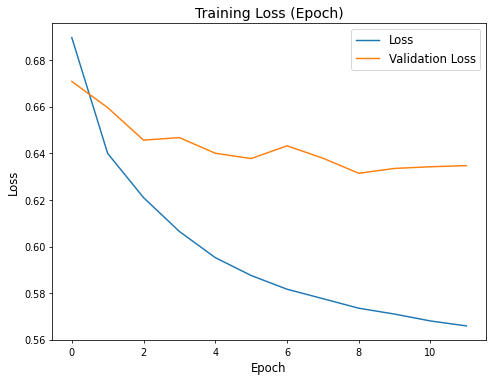

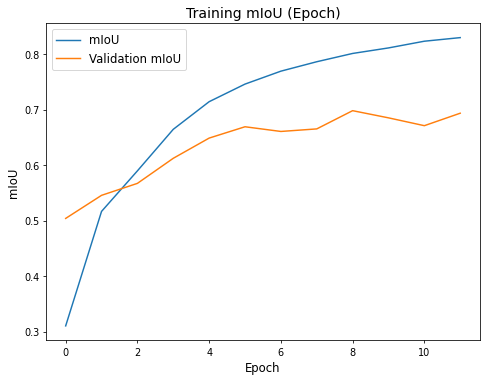

In [63]:
plt.figure(figsize=(8, 6), dpi=70)
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Training Loss (Epoch)", fontsize='x-large')
plt.ylabel("Loss", fontsize='large')
plt.xlabel("Epoch", fontsize='large')
plt.legend(['Loss', 'Validation Loss'], fontsize='large')
plt.savefig(data_save_dir + f'/loss.jpg')
plt.show()

plt.figure(figsize=(8, 6), dpi=70)
plt.plot(history.history["mIoU"])
plt.plot(history.history["val_mIoU"])
plt.title("Training mIoU (Epoch)",  fontsize='x-large')
plt.ylabel("mIoU", fontsize='large')
plt.xlabel("Epoch", fontsize='large')
plt.legend(['mIoU', 'Validation mIoU'], fontsize='large')
plt.savefig(data_save_dir + f'/miou.jpg')
plt.show()

### Evaluate the model

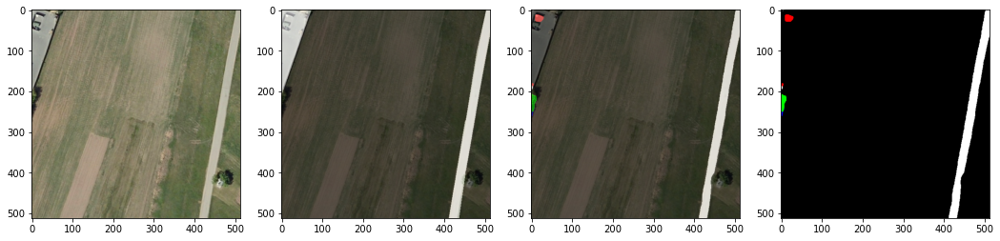

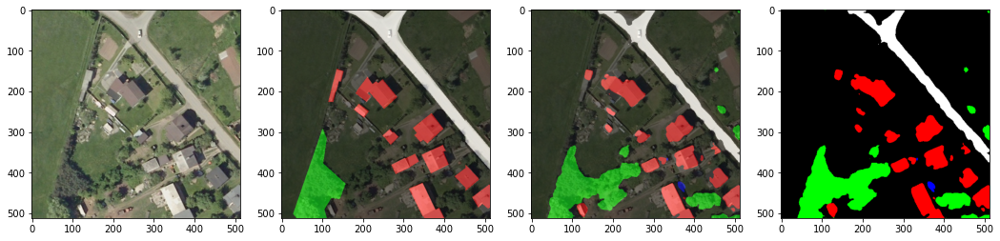

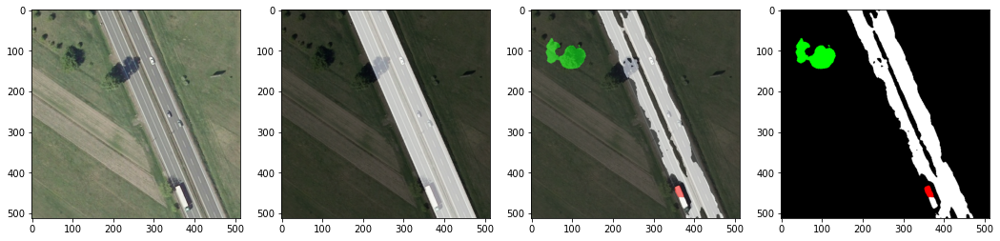

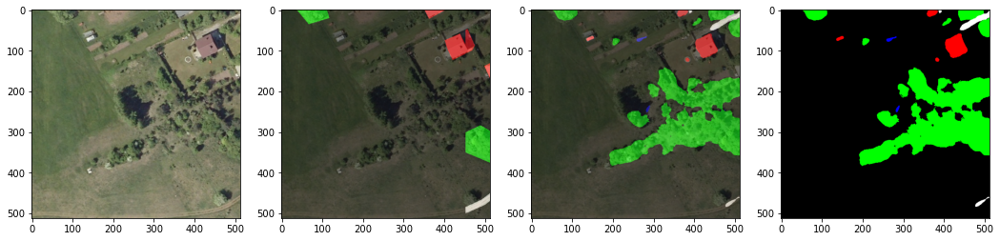

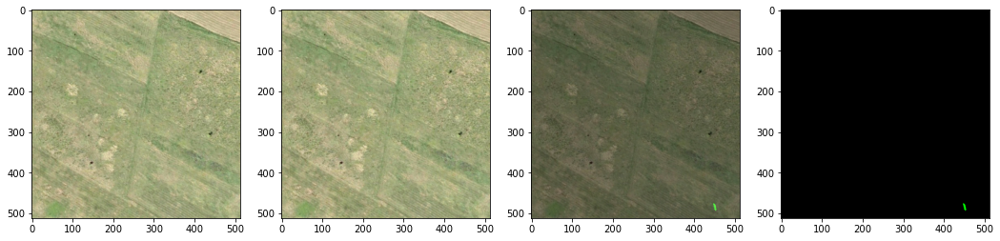

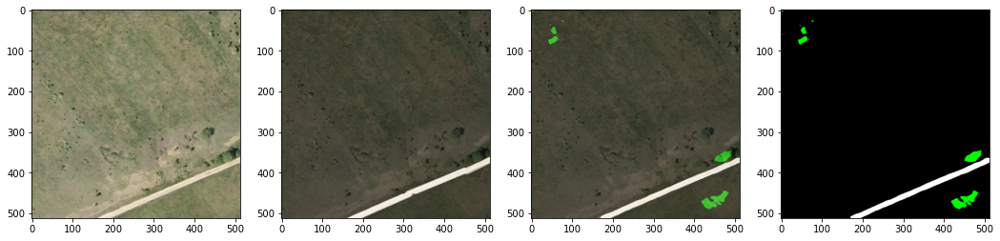

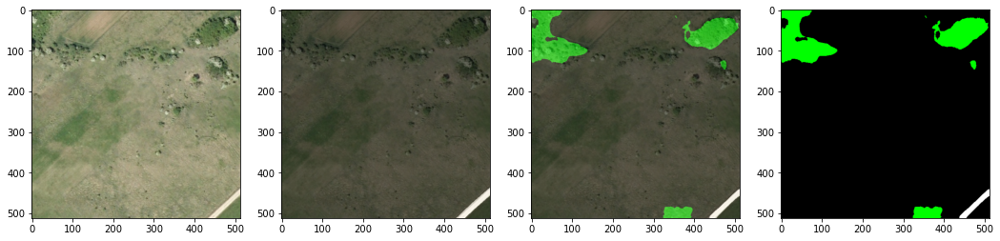

In [64]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [65]:
model.evaluate(test_dataset)

801/801 [==============================] - 68s 85ms/step - loss: 0.6371 - accuracy: 0.8991 - mIoU: 0.6857


[0.6371172070503235, 0.8991182446479797, 0.685738205909729]

In [66]:
every_class_iou = get_iou_for_every_class(test_images, test_masks, model)
every_class_iou

CSV won't be saved


,IoU score
background,0.846649
buildings,0.699378
woodland,0.832807
water,0.604701
roads,0.445156


In [67]:
model.load_weights(path_best_dice_loss)

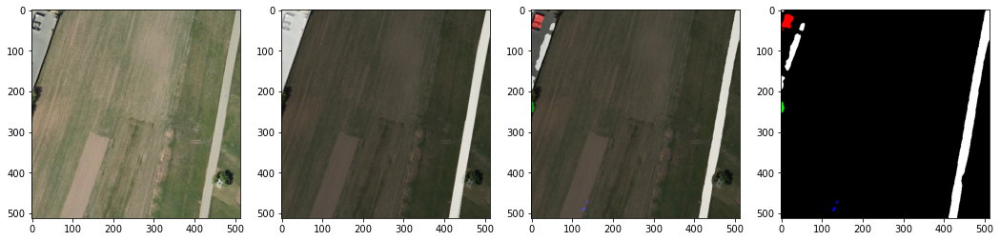

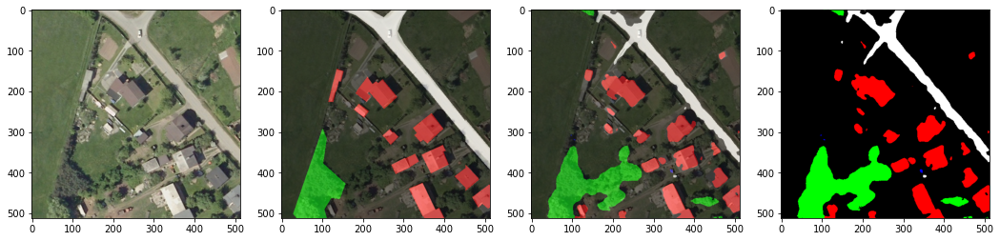

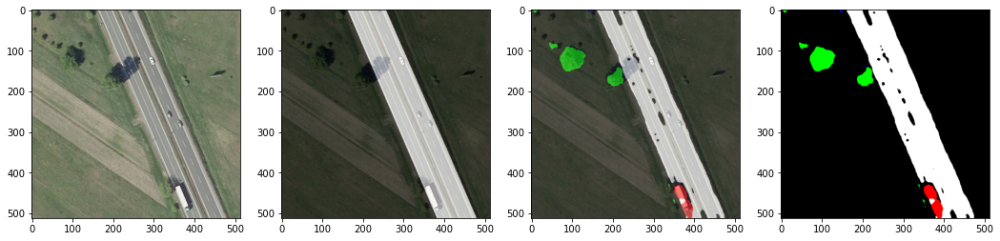

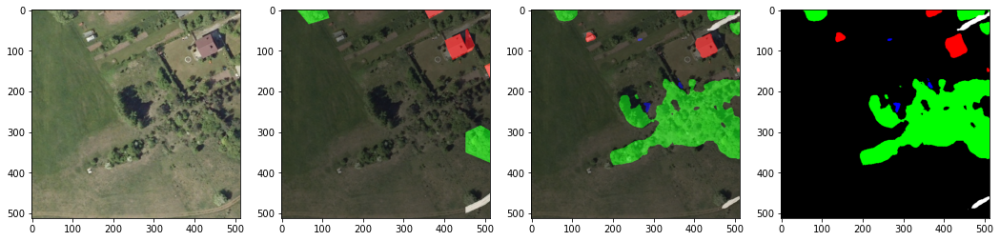

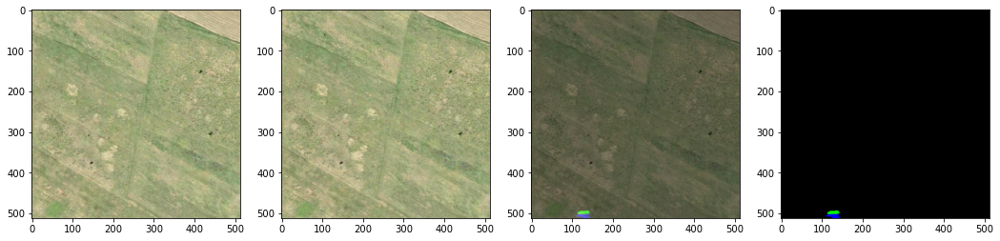

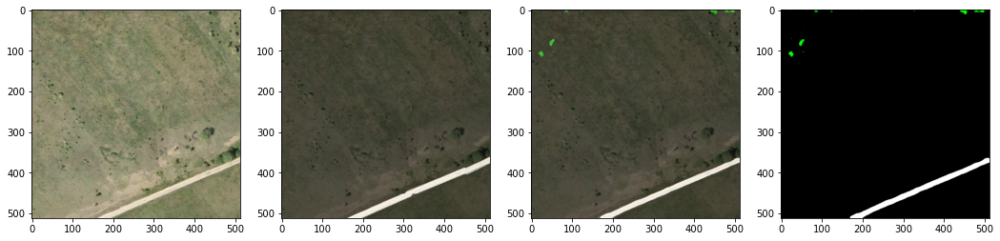

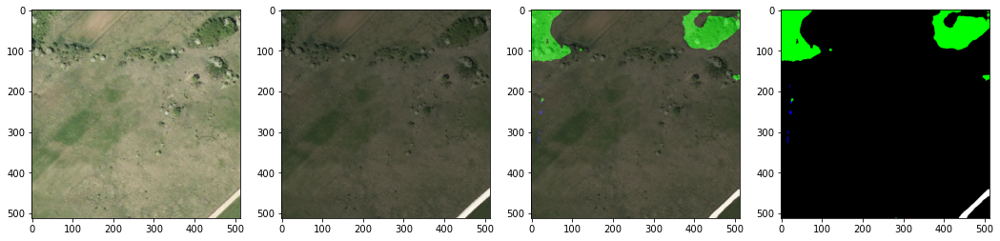

In [68]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [69]:
every_class_iou = get_iou_for_every_class(test_images, test_masks, model)
every_class_iou

CSV won't be saved


,IoU score
background,0.853606
buildings,0.686445
woodland,0.841172
water,0.614637
roads,0.447759


In [70]:
model.evaluate(test_dataset)

801/801 [==============================] - 69s 86ms/step - loss: 0.6333 - accuracy: 0.9038 - mIoU: 0.6887


[0.6332511305809021, 0.9038115739822388, 0.6887239217758179]

# Evaluate best model on modified test dataset 

In [74]:
file_names = ['test_images', 'test_masks']

data_lists = [test_images, test_masks]

remove_file_paths_according_to_previously_generated_txt(file_names, data_lists)

In [75]:
test_dataset = data_generator(test_images, test_masks)
print("Test Dataset:", test_dataset)
print("Number of images in Val Dataset:", BATCH_SIZE * len(test_dataset))

Test Dataset: <BatchDataset shapes: ((2, 512, 512, 3), (2, 512, 512, 1)), types: (tf.float32, tf.float32)>
Number of images in Val Dataset: 1570


In [76]:
model.evaluate(test_dataset)

785/785 [==============================] - 67s 86ms/step - loss: 0.6307 - accuracy: 0.9069 - mIoU: 0.6925


[0.6307117938995361, 0.9068858623504639, 0.6925135850906372]

In [ ]:
# to load history
# history_dict = json.load(open(history_path, 'r'))
# history_dict

# Train with lower lr

In [77]:
model = get_deeplab_model(weights=None, freeze_border=324)

In [78]:
model.load_weights(path_best_dice_loss)

In [79]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=10e-7),
    loss=soft_dice_loss,
    metrics=["accuracy", custom_mIoU_metric]
)

In [81]:
history_2 = model.fit(train_dataset, 
                    validation_data=val_dataset, 
                    epochs=EPOCHS,
                    callbacks=[early_stopping_val_mIoU,
                              best_miou,
                              best_val_loss]
                   )


Epoch 1/20
3677/3677 [==============================] - 875s 237ms/step - loss: 0.5708 - accuracy: 0.9527 - mIoU: 0.7901 - val_loss: 0.6372 - val_accuracy: 0.8977 - val_mIoU: 0.6783

Epoch 00001: val_mIoU did not improve from 0.69814

Epoch 00001: val_loss did not improve from 0.63143
Epoch 2/20
3677/3677 [==============================] - 876s 238ms/step - loss: 0.5682 - accuracy: 0.9552 - mIoU: 0.8212 - val_loss: 0.6339 - val_accuracy: 0.9143 - val_mIoU: 0.7108

Epoch 00002: val_mIoU improved from 0.69814 to 0.71079, saving model to /home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/DeepLabv3+/8.5_modified_deeplab/best_miou/checkpoint

Epoch 00002: val_loss did not improve from 0.63143
Epoch 3/20
3677/3677 [==============================] - 882s 240ms/step - loss: 0.5657 - accuracy: 0.9584 - mIoU: 0.8316 - val_loss: 0.6327 - val_accuracy: 0.9069 - val_mIoU: 0.7025

Epoch 00003: val_mIoU did not improve from 0.71079

Epoch 00003: va

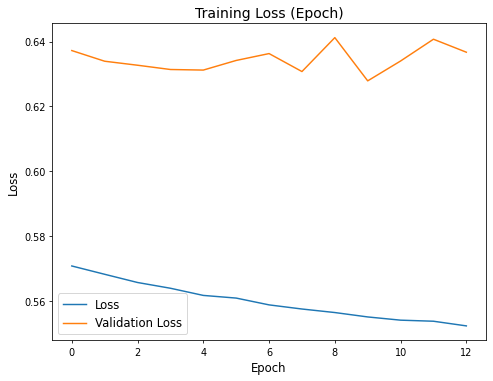

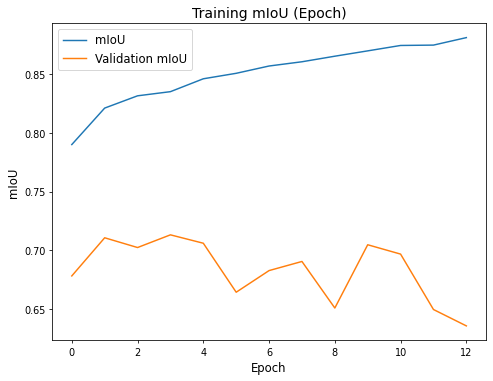

In [82]:
plt.figure(figsize=(8, 6), dpi=70)
plt.plot(history_2.history["loss"])
plt.plot(history_2.history["val_loss"])
plt.title("Training Loss (Epoch)", fontsize='x-large')
plt.ylabel("Loss", fontsize='large')
plt.xlabel("Epoch", fontsize='large')
plt.legend(['Loss', 'Validation Loss'], fontsize='large')
plt.savefig(data_save_dir + f'/loss_2.jpg')
plt.show()

plt.figure(figsize=(8, 6), dpi=70)
plt.plot(history_2.history["mIoU"])
plt.plot(history_2.history["val_mIoU"])
plt.title("Training mIoU (Epoch)",  fontsize='x-large')
plt.ylabel("mIoU", fontsize='large')
plt.xlabel("Epoch", fontsize='large')
plt.legend(['mIoU', 'Validation mIoU'], fontsize='large')
plt.savefig(data_save_dir + f'/miou_2.jpg')
plt.show()

In [83]:
history_path = data_save_dir + '/history_2.json'
history_dict = history_2.history
json.dump(history_dict, open(history_path, 'w'))

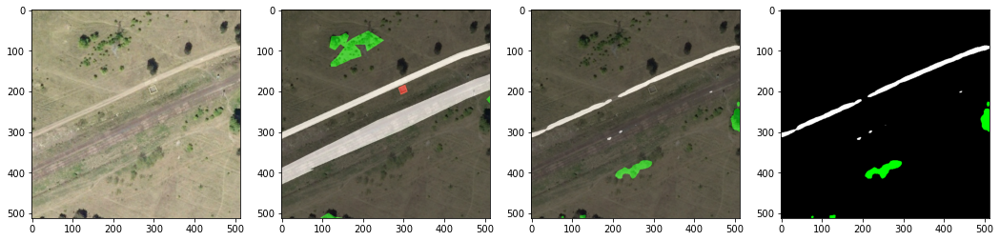

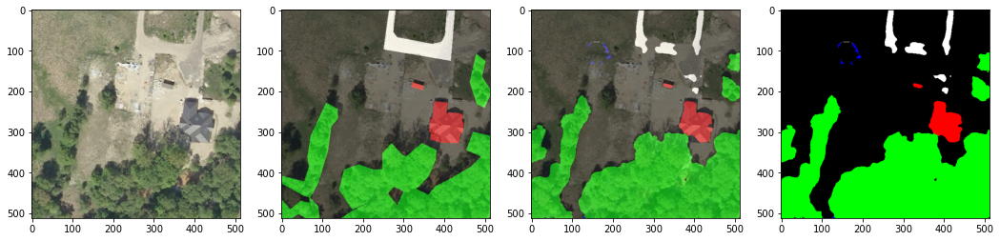

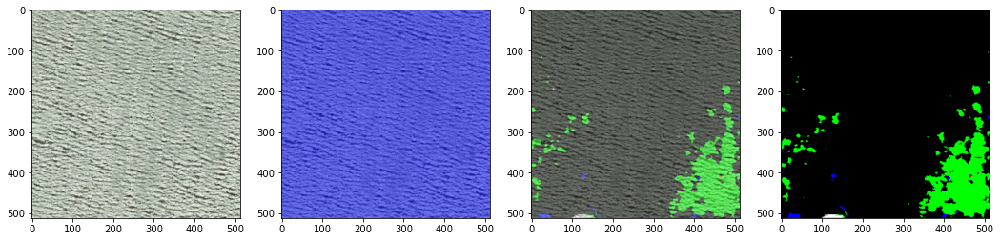

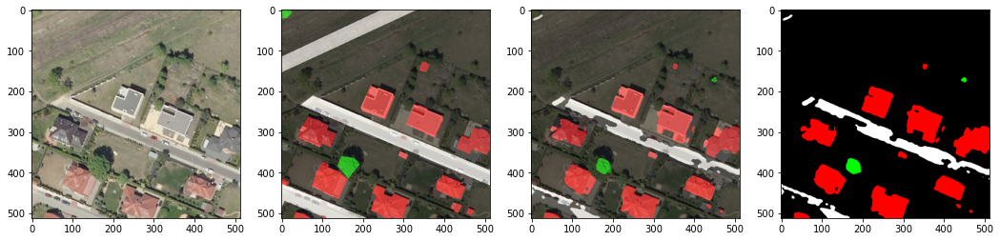

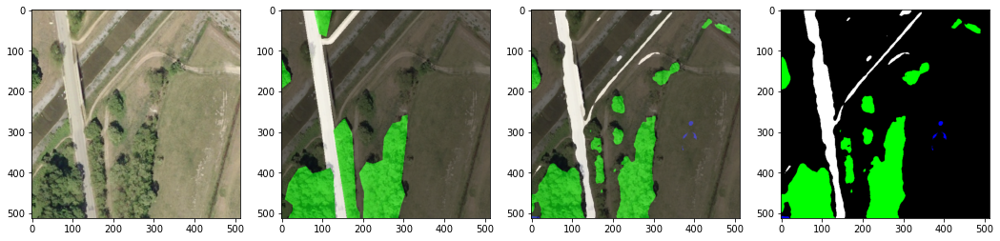

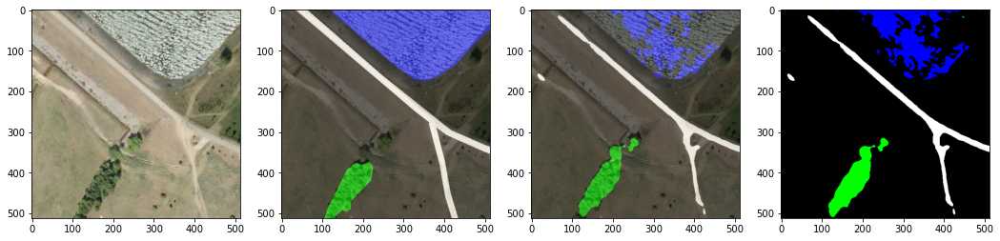

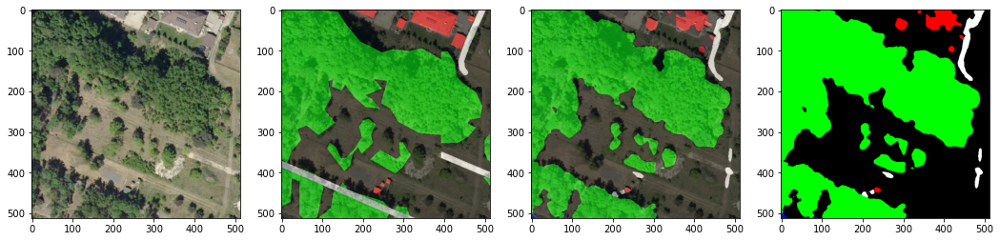

In [84]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

## Best mIoU evaluation

In [89]:
model.load_weights(path_best_miou)

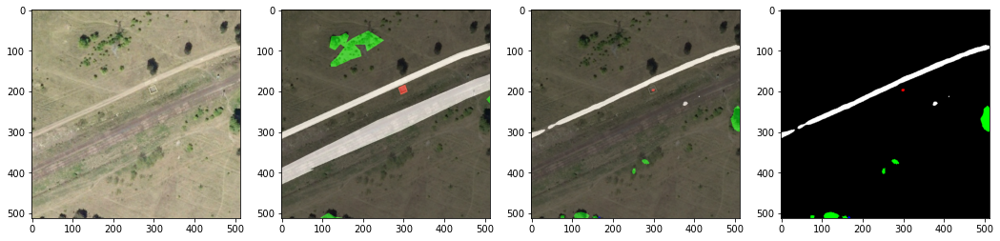

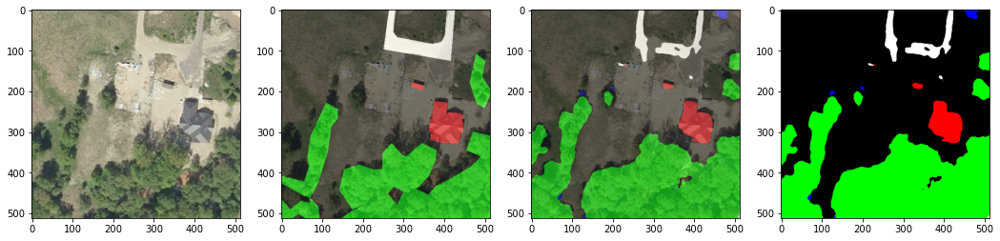

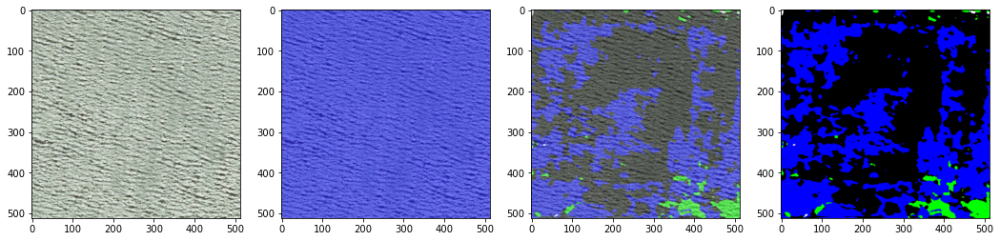

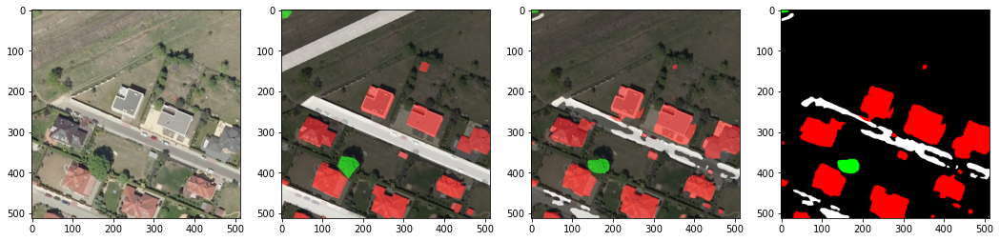

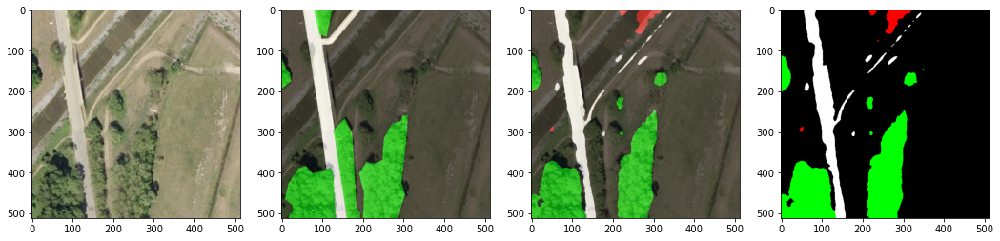

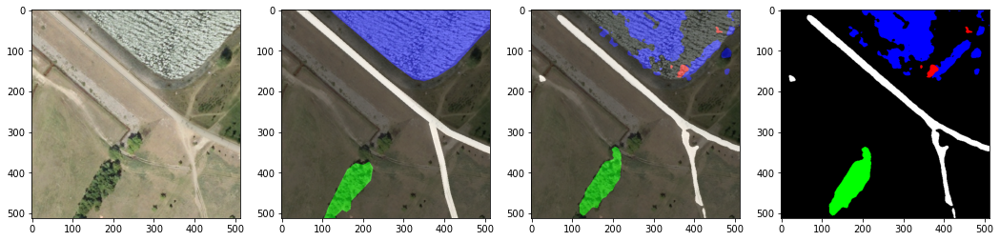

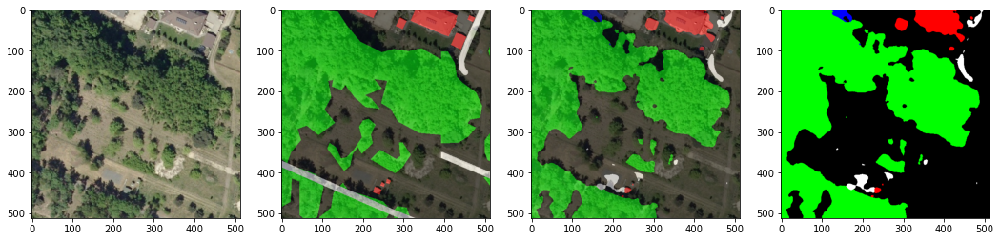

In [90]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [91]:
every_class_iou = get_iou_for_every_class(test_images, test_masks, model)
every_class_iou

CSV won't be saved


,IoU score
background,0.859420
buildings,0.695002
woodland,0.847125
water,0.653871
roads,0.456259


In [92]:
model.evaluate(test_dataset)

785/785 [==============================] - 66s 84ms/step - loss: 0.6323 - accuracy: 0.9075 - mIoU: 0.7023


[0.6322991251945496, 0.9075484275817871, 0.7022896409034729]

## Best validation loss evaluation

In [93]:
model.load_weights(path_best_dice_loss)

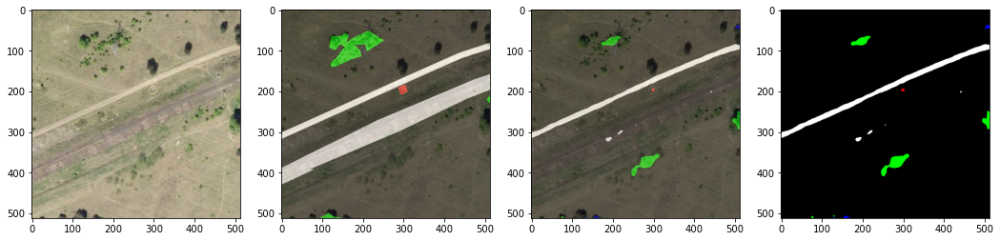

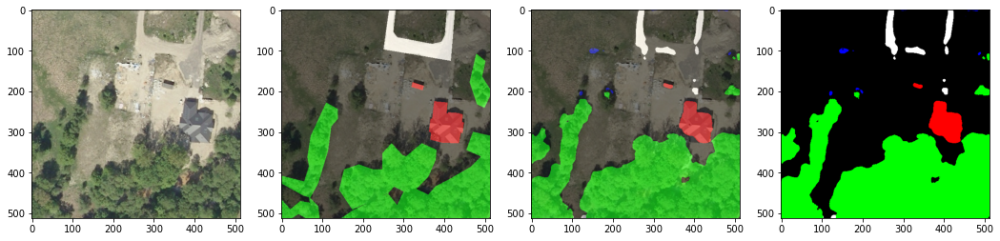

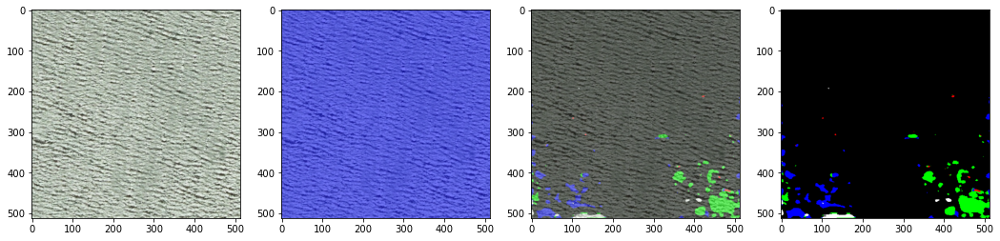

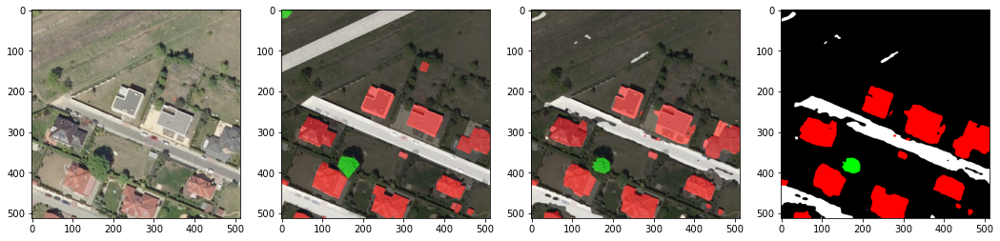

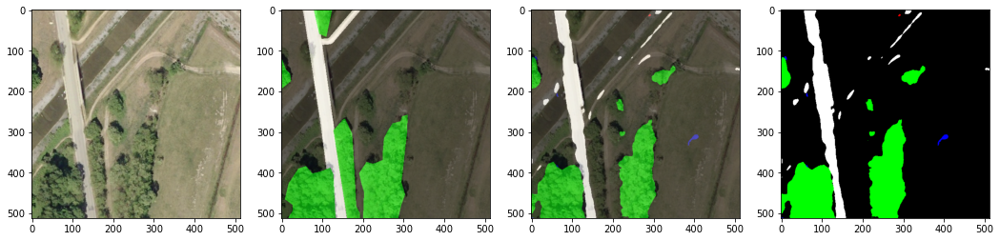

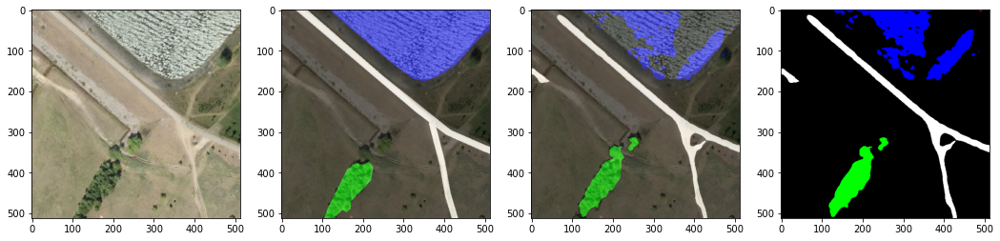

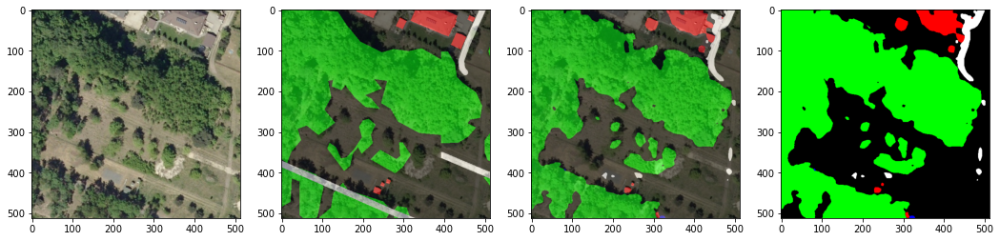

In [86]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [88]:
every_class_iou = get_iou_for_every_class(test_images, test_masks, model)
every_class_iou

CSV won't be saved


,IoU score
background,0.852125
buildings,0.704679
woodland,0.846684
water,0.584536
roads,0.499365


In [87]:
model.evaluate(test_dataset)

785/785 [==============================] - 67s 86ms/step - loss: 0.6292 - accuracy: 0.9026 - mIoU: 0.6975


[0.6292474865913391, 0.9026390314102173, 0.6974681615829468]

In [94]:
test_images = sorted(glob(os.path.join(TEST_PATH, "images/img/*")))
test_masks = sorted(glob(os.path.join(TEST_PATH, "masks/img/*")))

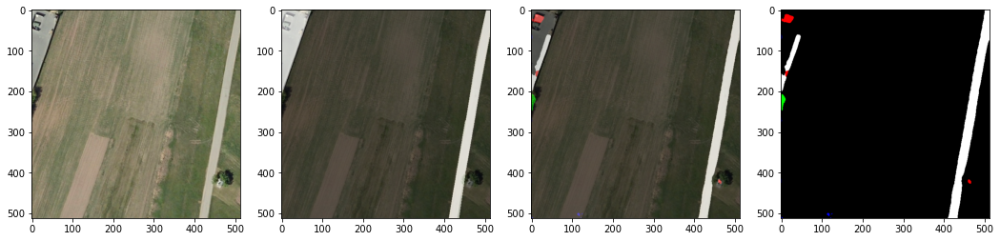

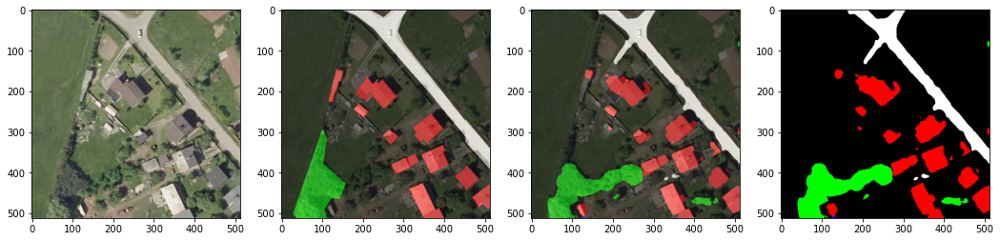

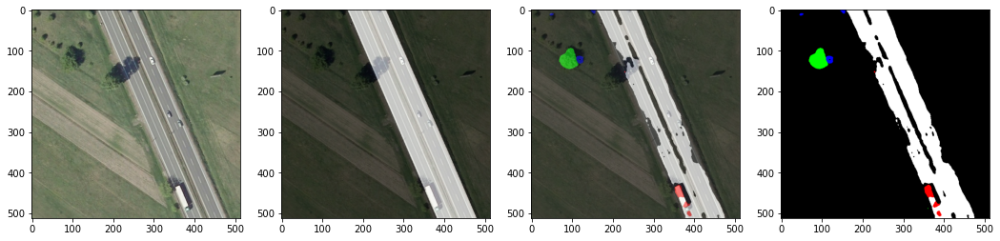

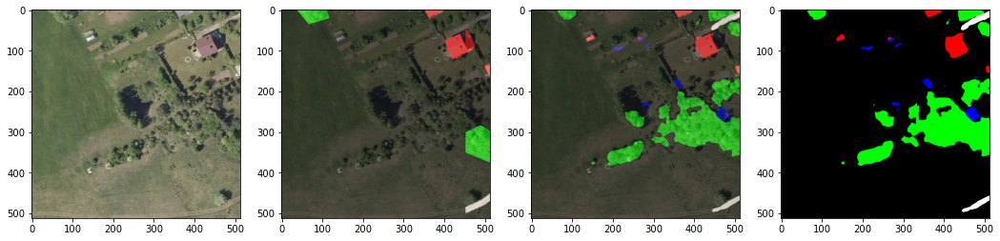

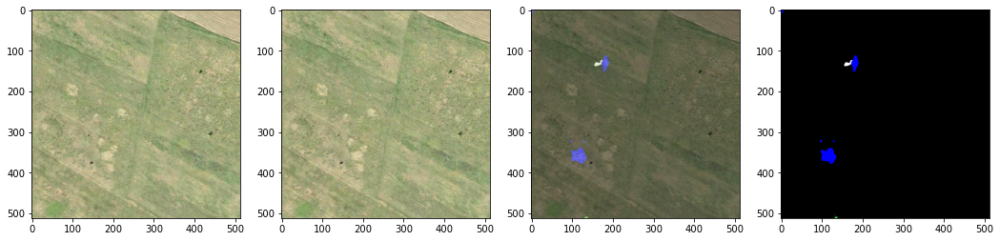

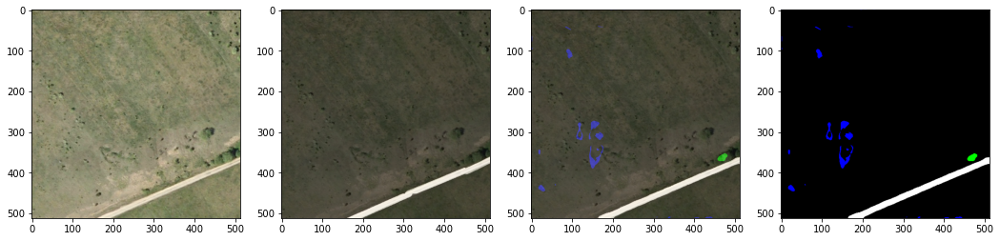

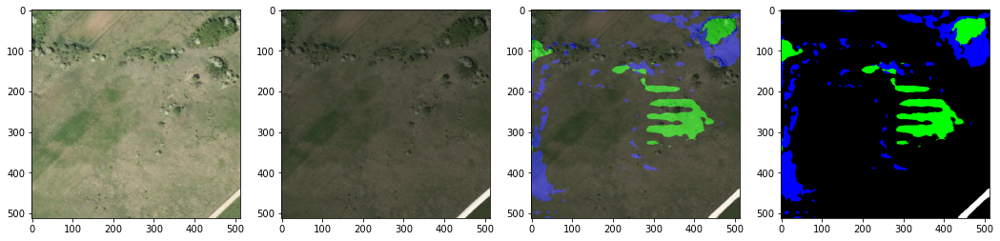

In [95]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [96]:
model.load_weights(path_best_miou)

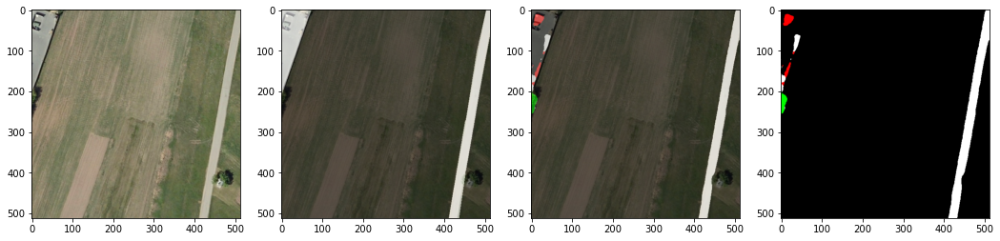

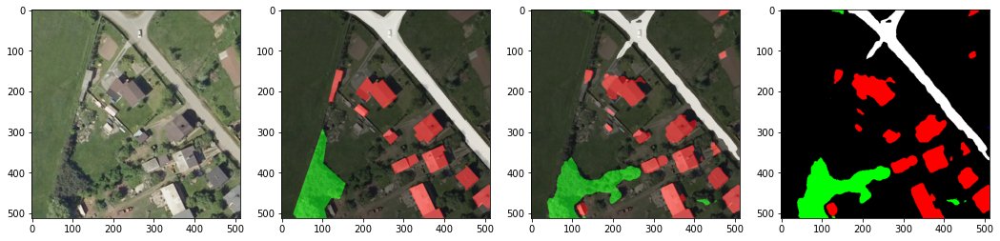

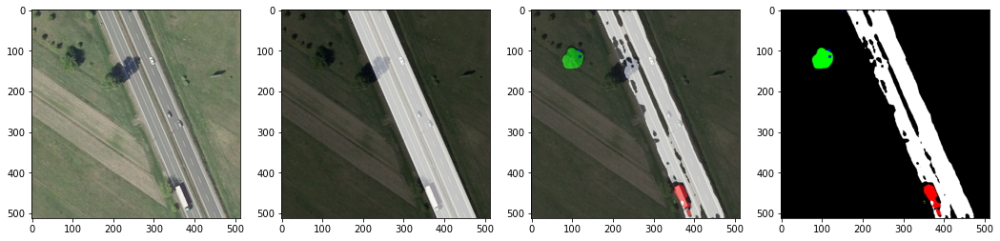

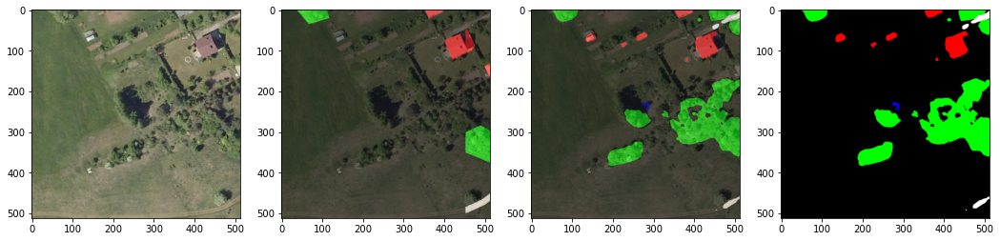

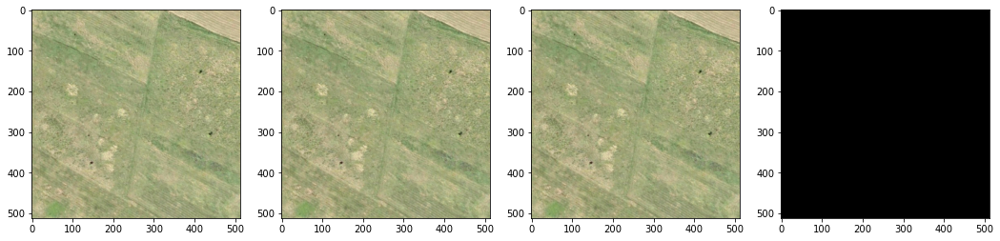

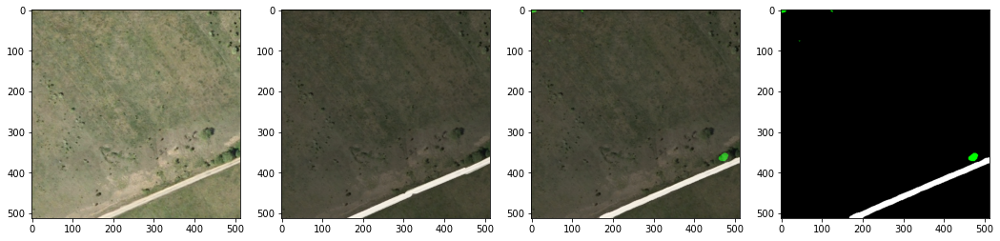

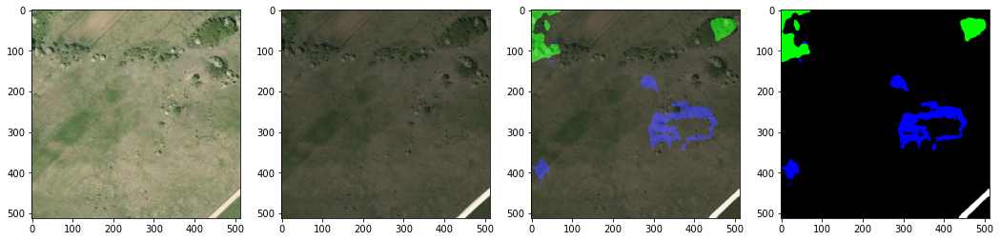

In [97]:
left_range = 448
right_range = 455

plot_predictions(test_images[left_range:right_range],
                 test_masks[left_range:right_range],
                 colormap,
                 model=model)

In [180]:
# to load history
history = json.load(open(f'/home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/history.json', 'r'))
history_2 = json.load(open(f'/home/marcin/git_workspace/Semantic-segmentation-for-LandCover.ai-dataset/notebooks/exploratory/results/DeepLabv3+/{VERSION}_modified_deeplab/history_2.json', 'r'))

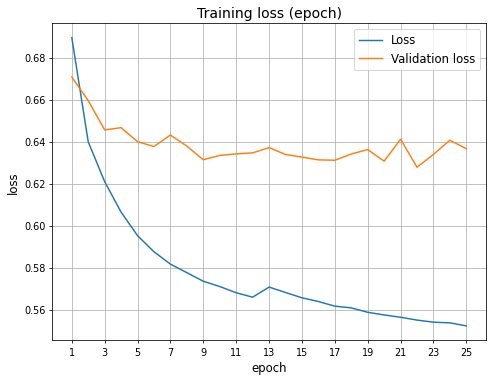

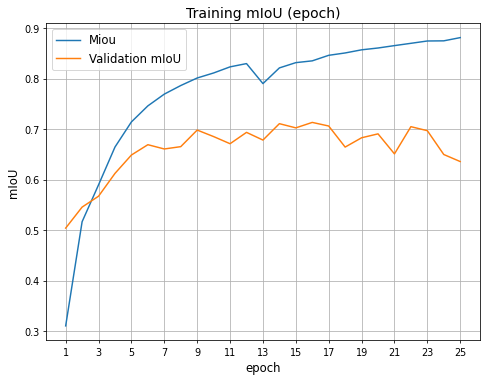

In [181]:
for name in ['loss', 'mIoU']:
    
    history_train = history[f"{name}"] + history_2[f"{name}"]
    history_val = history[f"val_{name}"] + history_2[f"val_{name}"]
    num_epochs = (len(history["val_loss"]) + len(history_2["val_loss"]))

    plt.figure(figsize=(8, 6), dpi=70)
    plt.plot(np.arange(1, num_epochs+1, step=1), history_train)
    plt.plot(np.arange(1, num_epochs+1, step=1), history_val)
    plt.title(f"Training {name} (epoch)", fontsize='x-large')
    plt.ylabel(f"{name}", fontsize='large')
    plt.xlabel("epoch", fontsize='large')
    plt.legend([f'{name}'.capitalize(), f'Validation {name}'], fontsize='large')
    plt.xticks(np.arange(1, num_epochs+1, step=2))
    plt.grid()
    plt.savefig(data_save_dir + f'/{name}_all.jpg')
    plt.show()